Clean data using (Vim commands):
```
%s/\n//g
%s/\|\|`\|\|/\n/g
```


In [2]:
import pandas as pd
import spacy as sp
import numpy as np
import preprocessor as p
import plotly.express as px
import matplotlib.pyplot as plt
import re


In [3]:
df = pd.read_csv("./data_real.csv", skipinitialspace=True,
                 sep=r"\|\|,\|\|", engine="python")
df.columns = ["timestamp", "tweet"]  # type: ignore


In [4]:
df.head()


,timestamp,tweet
0,"""2022-11-20T18:48:58.000Z""","""@SoniaBe81708735 Dark family experience laug..."
1,"""2022-11-20T18:48:59.000Z""","""RT @MasTwinkAtex: Horny after my ride 🫠 http..."
2,"""2022-11-20T18:48:58.000Z""","""RT @Shiffa_ZY: Shocking revelations if true…..."
3,"""2022-11-20T18:48:59.000Z""","""@summarie_mata ARMY ATTACK ON MAMA"""
4,"""2022-11-20T18:48:59.000Z""","""@AaronQuinn716 @GregTompsett Aaron they’re n..."


In [5]:
def preprocess_tweet(row):
    text = row['tweet']
    text = p.clean(text)
    return text


In [6]:
df['clean_tweet'] = df.apply(preprocess_tweet, axis=1)
df[:6]


,timestamp,tweet,clean_tweet
0,"""2022-11-20T18:48:58.000Z""","""@SoniaBe81708735 Dark family experience laug...",""" Dark family experience laugh deal available ..."
1,"""2022-11-20T18:48:59.000Z""","""RT @MasTwinkAtex: Horny after my ride 🫠 http...","""RT : Horny after my ride """
2,"""2022-11-20T18:48:58.000Z""","""RT @Shiffa_ZY: Shocking revelations if true…...","""RT : Shocking revelations if true How about S..."
3,"""2022-11-20T18:48:59.000Z""","""@summarie_mata ARMY ATTACK ON MAMA""",""" ARMY ATTACK ON MAMA"""
4,"""2022-11-20T18:48:59.000Z""","""@AaronQuinn716 @GregTompsett Aaron they’re n...",""" Aaron theyre not making the playoffs in a ye..."
5,"""2022-11-20T18:48:59.000Z""","""The Day of My Return is nearer than you thin...","""The Day of My Return is nearer than you think """


In [7]:

from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
SIA = SentimentIntensityAnalyzer()
df["clean_tweet"] = df["clean_tweet"].astype(str)
df['Polarity Score'] = df["clean_tweet"].apply(
    lambda x: SIA.polarity_scores(x)['compound'])
df['Neutral Score'] = df["clean_tweet"].apply(
    lambda x: SIA.polarity_scores(x)['neu'])
df['Negative Score'] = df["clean_tweet"].apply(
    lambda x: SIA.polarity_scores(x)['neg'])
df['Positive Score'] = df["clean_tweet"].apply(
    lambda x: SIA.polarity_scores(x)['pos'])
df['Sentiment'] = ''
df.loc[df['Polarity Score'] > 0, 'Sentiment'] = 'Positive'
df.loc[df['Polarity Score'] == 0, 'Sentiment'] = 'Neutral'
df.loc[df['Polarity Score'] < 0, 'Sentiment'] = 'Negative'
df[:5]


,timestamp,tweet,clean_tweet,Polarity Score,Neutral Score,Negative Score,Positive Score,Sentiment
0,"""2022-11-20T18:48:58.000Z""","""@SoniaBe81708735 Dark family experience laug...",""" Dark family experience laugh deal available ...",0.5574,0.735,0.000,0.265,Positive
1,"""2022-11-20T18:48:59.000Z""","""RT @MasTwinkAtex: Horny after my ride 🫠 http...","""RT : Horny after my ride """,0.0000,1.000,0.000,0.000,Neutral
2,"""2022-11-20T18:48:58.000Z""","""RT @Shiffa_ZY: Shocking revelations if true…...","""RT : Shocking revelations if true How about S...",0.0258,0.744,0.126,0.130,Positive
3,"""2022-11-20T18:48:59.000Z""","""@summarie_mata ARMY ATTACK ON MAMA""",""" ARMY ATTACK ON MAMA""",-0.4767,0.492,0.508,0.000,Negative
4,"""2022-11-20T18:48:59.000Z""","""@AaronQuinn716 @GregTompsett Aaron they’re n...",""" Aaron theyre not making the playoffs in a ye...",0.8481,0.759,0.000,0.241,Positive


In [8]:
fig_pie = px.pie(df, names='Sentiment', title='Tweet Classification', height=500,
                 hole=0.0)
fig_pie.update_traces(textfont=dict(color='#fff'))


In [9]:
pol = df["Polarity Score"]
pol.head()
pol.describe()


count    573735.000000
mean          0.113781
std           0.406630
min          -0.995800
25%           0.000000
50%           0.000000
75%           0.440400
max           0.998600
Name: Polarity Score, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

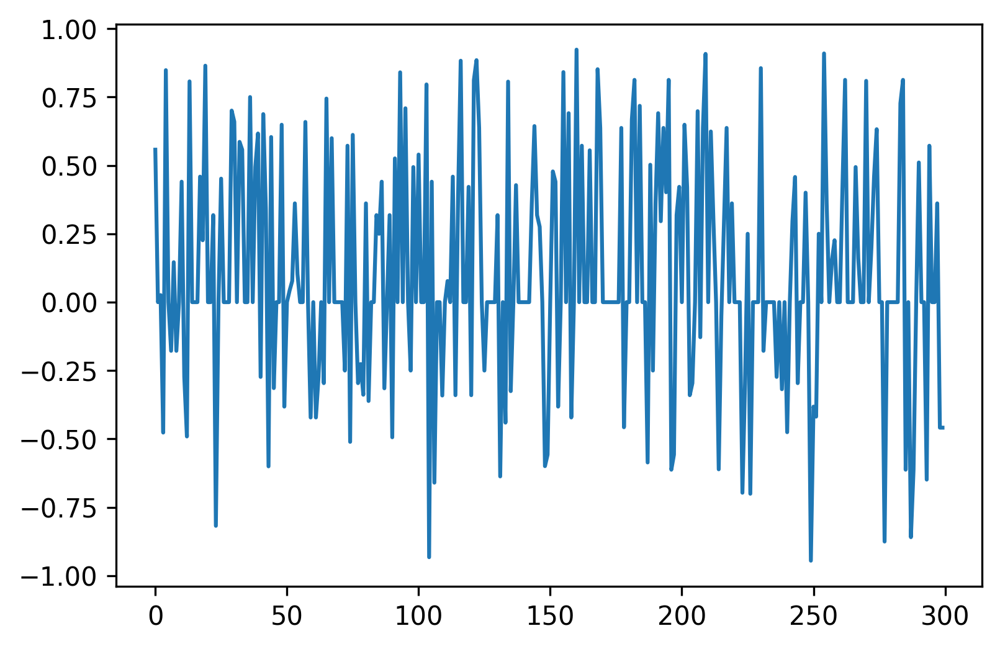

In [10]:
plt.figure(dpi=300)
plt.plot(pol[:300])
plt.show


In [11]:
pos = df["Positive Score"]
neg = df["Negative Score"]
neu = df["Neutral Score"]


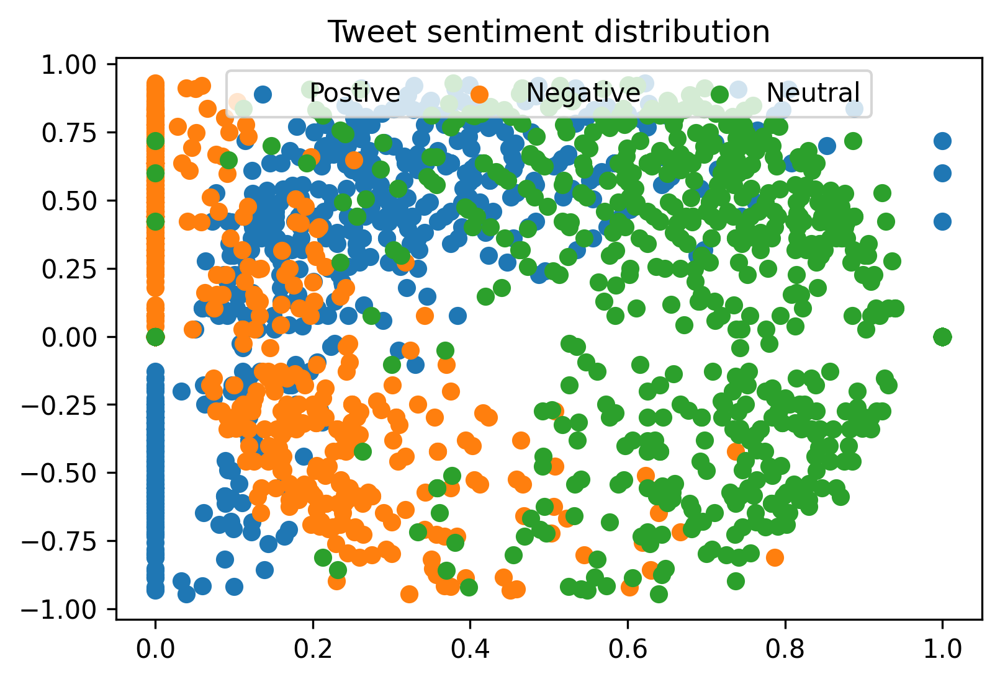

In [20]:
plt.figure(dpi=300)
plt.title("Tweet sentiment distribution")
plt.scatter(pos[:1000], pol[:1000], label="Postive")
plt.scatter(neg[:1000], pol[:1000], label="Negative")
plt.scatter(neu[:1000], pol[:1000], label="Neutral")
plt.legend(loc="upper center", ncol=3)
plt.show()


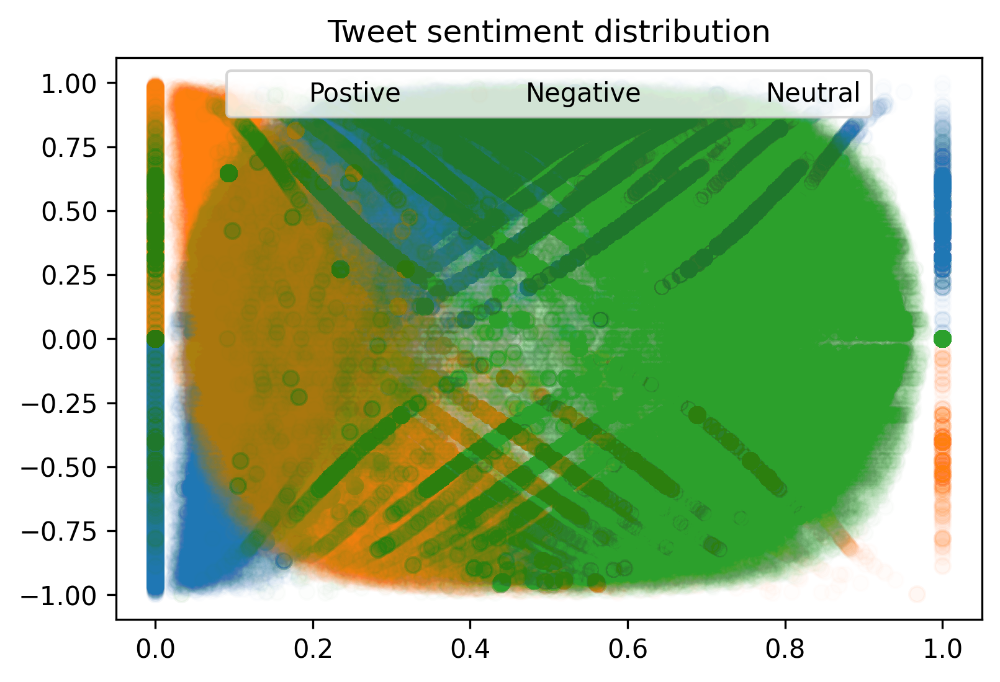

In [14]:
plt.figure(dpi=300)
plt.title("Tweet sentiment distribution")
plt.scatter(pos, pol, label="Postive", alpha=0.01)
plt.scatter(neg, pol, label="Negative", alpha=0.01)
plt.scatter(neu, pol, label="Neutral", alpha=0.01)
plt.legend(loc="upper center", ncol=3)
plt.show()
